# 2024 날씨 빅데이터 콘테스트 

## 전력 분야 - 기상에 따른 공동주택 전력수요 예측 개선 

In [1]:
import pandas as pd
import os 

import matplotlib.pyplot as plt
plt.rcParams['font.family'] ='Malgun Gothic'
plt.rcParams['axes.unicode_minus'] =False

import seaborn as sns
import numpy as np

import warnings
warnings.filterwarnings(action='ignore')

In [2]:
df = pd.read_csv('./data/electric_train_cp949.csv', encoding='cp949', index_col=0)
df['electric_train.tm'] = pd.to_datetime(df['electric_train.tm'])

print(df.shape)

(7593355, 16)


In [3]:
print(len(df['electric_train.num'].unique()))

323


In [4]:
# 각 피처별 고유값 개수 확인
df.apply(lambda x: x.nunique())

electric_train.num               323
electric_train.tm              26304
electric_train.hh24               24
electric_train.n                 146
electric_train.stn               185
electric_train.sum_qctr          769
electric_train.sum_load       918787
electric_train.n_mean_load       866
electric_train.nph_ta            592
electric_train.nph_hm            951
electric_train.nph_ws_10m        217
electric_train.nph_rn_60m        546
electric_train.nph_ta_chi        635
electric_train.weekday             7
electric_train.week_name           2
electric_train.elec            19145
dtype: int64

In [5]:
elec_cols = ['electric_train.'+ a for a in ['tm', 'hh24', 'weekday', 'week_name', 'sum_qctr', 'n', 'sum_load', 'n_mean_load', 'elec']]

df_elec = df[elec_cols]

colunms = {}
for col in elec_cols:
    colunms[col] = col.split('.')[1]

df_elec = df_elec.rename(columns=colunms)

df_elec.head()

,tm,hh24,weekday,week_name,sum_qctr,n,sum_load,n_mean_load,elec
1,2021-01-01 01:00:00,1,4,0,6950,11,751.32,68.606449,99.56
2,2021-01-01 02:00:00,2,4,0,6950,11,692.60,68.606449,91.78
3,2021-01-01 03:00:00,3,4,0,6950,11,597.48,68.606449,79.17
4,2021-01-01 04:00:00,4,4,0,6950,11,553.48,68.606449,73.34
5,2021-01-01 05:00:00,5,4,0,6950,11,526.24,68.606449,69.73


In [6]:
weat_cols = ['electric_train.'+ a for a in ['num', 'stn', 'nph_ta', 'nph_hm', 'nph_ws_10m', 'nph_rn_60m', 'nph_ta_chi']]

df_weat = df[weat_cols]

colunms = {}
for col in weat_cols:
    colunms[col] = col.split('.')[1]

df_weat = df_weat.rename(columns=colunms)

df_weat.head()

,num,stn,nph_ta,nph_hm,nph_ws_10m,nph_rn_60m,nph_ta_chi
1,4821,884,2.2,62.7,1.8,0.0,-1.0
2,4821,884,2.3,63.1,2.1,0.0,-0.6
3,4821,884,2.2,62.4,2.5,0.0,-1.3
4,4821,884,1.7,63.5,1.7,0.0,-0.2
5,4821,884,1.7,63.0,1.6,0.0,-0.8


In [7]:
reset_order_cols = elec_cols + weat_cols

df_new = df[reset_order_cols]
colunms = {}
for col in reset_order_cols:
    colunms[col] = col.split('.')[1]

df_new = df_new.rename(columns=colunms)

df_new.head()

,tm,hh24,weekday,week_name,sum_qctr,n,sum_load,n_mean_load,elec,num,stn,nph_ta,nph_hm,nph_ws_10m,nph_rn_60m,nph_ta_chi
1,2021-01-01 01:00:00,1,4,0,6950,11,751.32,68.606449,99.56,4821,884,2.2,62.7,1.8,0.0,-1.0
2,2021-01-01 02:00:00,2,4,0,6950,11,692.60,68.606449,91.78,4821,884,2.3,63.1,2.1,0.0,-0.6
3,2021-01-01 03:00:00,3,4,0,6950,11,597.48,68.606449,79.17,4821,884,2.2,62.4,2.5,0.0,-1.3
4,2021-01-01 04:00:00,4,4,0,6950,11,553.48,68.606449,73.34,4821,884,1.7,63.5,1.7,0.0,-0.2
5,2021-01-01 05:00:00,5,4,0,6950,11,526.24,68.606449,69.73,4821,884,1.7,63.0,1.6,0.0,-0.8


In [8]:
df_new.isnull().sum()

tm             0
hh24           0
weekday        0
week_name      0
sum_qctr       0
n              0
sum_load       0
n_mean_load    0
elec           0
num            0
stn            0
nph_ta         0
nph_hm         0
nph_ws_10m     0
nph_rn_60m     0
nph_ta_chi     0
dtype: int64

In [9]:
df_new['year'] = df_new['tm'].dt.year
df_new['month'] = df_new['tm'].dt.month
df_new['day'] = df_new['tm'].dt.day

In [10]:
df_new = df_new.sort_values(by='tm')
df_new.head()

,tm,hh24,weekday,week_name,sum_qctr,n,sum_load,n_mean_load,elec,num,stn,nph_ta,nph_hm,nph_ws_10m,nph_rn_60m,nph_ta_chi,year,month,day
2647991,2020-01-01 01:00:00,1,2,0,63850,39,9732.96,250.490543,99.63,13615,140,-8.5,74.5,0.9,0.0,-5.8,2020,1,1
5208382,2020-01-01 01:00:00,1,2,0,14750,20,2401.12,116.010234,103.49,18235,565,-8.8,25.6,1.9,0.0,-4.6,2020,1,1
5182078,2020-01-01 01:00:00,1,2,0,71630,32,12139.16,363.252769,104.43,18234,565,-8.8,25.6,1.9,0.0,-4.6,2020,1,1
5155774,2020-01-01 01:00:00,1,2,0,45840,28,6723.84,225.924357,106.29,18233,512,-6.3,31.3,2.5,0.0,-7.8,2020,1,1
1280137,2020-01-01 01:00:00,1,2,0,76450,44,12949.24,287.250770,102.45,11272,941,2.4,68.0,1.2,0.0,-5.3,2020,1,1


In [11]:
# 시즌을 결정하는 함수
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Fall'

# 'season' 컬럼 추가
df_new['season'] = df_new['tm'].dt.month.apply(get_season)

In [12]:
df_new.columns

Index(['tm', 'hh24', 'weekday', 'week_name', 'sum_qctr', 'n', 'sum_load',
       'n_mean_load', 'elec', 'num', 'stn', 'nph_ta', 'nph_hm', 'nph_ws_10m',
       'nph_rn_60m', 'nph_ta_chi', 'year', 'month', 'day', 'season'],
      dtype='object')

In [13]:
new_col_order = ['tm', 'year', 'season', 'month','day', 'weekday', 'hh24',
       'week_name', 'sum_qctr',
       'n', 'sum_load',
       'n_mean_load',
       'num', 'stn', 'nph_ta',
       'nph_hm', 'nph_ws_10m',
       'nph_rn_60m', 'nph_ta_chi', 'elec']

In [14]:
df_new = df_new[new_col_order]

In [15]:
df_new.head()

,tm,year,season,month,day,weekday,hh24,week_name,sum_qctr,n,sum_load,n_mean_load,num,stn,nph_ta,nph_hm,nph_ws_10m,nph_rn_60m,nph_ta_chi,elec
2647991,2020-01-01 01:00:00,2020,Winter,1,1,2,1,0,63850,39,9732.96,250.490543,13615,140,-8.5,74.5,0.9,0.0,-5.8,99.63
5208382,2020-01-01 01:00:00,2020,Winter,1,1,2,1,0,14750,20,2401.12,116.010234,18235,565,-8.8,25.6,1.9,0.0,-4.6,103.49
5182078,2020-01-01 01:00:00,2020,Winter,1,1,2,1,0,71630,32,12139.16,363.252769,18234,565,-8.8,25.6,1.9,0.0,-4.6,104.43
5155774,2020-01-01 01:00:00,2020,Winter,1,1,2,1,0,45840,28,6723.84,225.924357,18233,512,-6.3,31.3,2.5,0.0,-7.8,106.29
1280137,2020-01-01 01:00:00,2020,Winter,1,1,2,1,0,76450,44,12949.24,287.250770,11272,941,2.4,68.0,1.2,0.0,-5.3,102.45


### 이상치 처리

In [16]:
# 온도별 elec의 이상치 처리 
for idx in list(df_new.loc[df_new['elec'] < 0, 'nph_ta'].index):
    area_num = df_new.loc[idx]['num']
    season = df_new.loc[idx]['season']
    year = df_new.loc[idx]['year']
    temp = df_new.loc[idx]['nph_ta']
    df_new.loc[idx, 'elec'] = \
        df_new.loc[(df_new.loc[idx]['num'] == area_num) & (df_new.loc[idx]['year'] == year) & (df_new.loc[idx]['season'] == season) & (df_new['nph_ta'] == temp), :]['elec'].mean()
        # 해당 지역의 해당 연도의 해당 시즌의 해당 온도와 같은 날의 elec의 평균

In [17]:
# 풍속이 음수인 값을 갖는 이상치 처리

ano_list = list(df_new.loc[df_new['nph_ws_10m'] < 0, 'nph_ws_10m'].index)
for idx in ano_list:
    pre_idx = idx - 1
    nex_idx = idx + 1

    previous_value = df_new.loc[pre_idx, 'nph_ws_10m']
    next_value = df_new.loc[nex_idx, 'nph_ws_10m']
    mean_val = (previous_value + next_value) / 2
    df_new.loc[idx, 'nph_ws_10m'] = mean_val

In [72]:
# https://docs.kanaries.net/ko/topics/Pandas/pandas-rename-column
# !pip install pygwalker

  Using cached appdirs-1.4.4-py2.py3-none-any.whl.metadata (9.0 kB)
  Using cached cachetools-5.3.3-py3-none-any.whl.metadata (5.3 kB)
     ---------------------------------------- 0.0/109.0 kB ? eta -:--:--
     -------------------------------------- 109.0/109.0 kB 6.2 MB/s eta 0:00:00
  Using cached requests-2.32.3-py3-none-any.whl.metadata (4.6 kB)
  Using cached SQLAlchemy-2.0.30-cp311-cp311-win_amd64.whl.metadata (9.8 kB)
  Using cached backoff-2.2.1-py3-none-any.whl.metadata (14 kB)
  Using cached monotonic-1.6-py2.py3-none-any.whl.metadata (1.5 kB)
  Using cached charset_normalizer-3.3.2-cp311-cp311-win_amd64.whl.metadata (34 kB)
  Using cached idna-3.7-py3-none-any.whl.metadata (9.9 kB)
  Using cached urllib3-2.2.1-py3-none-any.whl.metadata (6.4 kB)
  Using cached certifi-2024.6.2-py3-none-any.whl.metadata (2.2 kB)
  Using cached annotated_types-0.7.0-py3-none-any.whl.metadata (15 kB)
  Using cached greenlet-3.0.3-cp311-cp311-win_amd64.whl.metadata (3.9 kB)
  Using cached impor

In [73]:
import pandas as pd
import pygwalker as pyg

In [74]:
walker = pyg.walk(df_new)

Box(children=(HTML(value='<div id="ifr-pyg-00061a43076f889awrUSWxL1M5EcYVfd" style="height: auto">\n    <head>…

### 2.1. Target Distribution

Target에 해당하는 elec(전력기상지수)의 분포를 살펴보겠습니다.

평균(location), 표준편차(scale), 왜도(skewness)를 기준으로 살펴 보겠습니다.

In [143]:
spots_num = sorted(df_new['num'].unique().tolist())
df_1 = df_new[df_new['num']==spots_num[1]]
spots_num[:10]

[4821, 5565, 5566, 5567, 8994, 9609, 9735, 9736, 9758, 9759]

In [146]:
no_2020 = []
yes_2020 = []
for i in range(len(spots_num)):
    a = str(df_new[df_new['num']==spots_num[i]]['tm'].min())
    b = str(df_1['tm'].min())

    if a != b:
        no_2020.append(spots_num[i])
    else:
        yes_2020.append(spots_num[i])
        
print(len(no_2020))  # 2020년도 데이터가 없는 격자 지역 개수 23개
print(len(yes_2020)) # 2020년도 데이터가 있는 격자 지역 개수 300개

23
300


In [160]:
df_final = df_new[df_new['num'].isin(yes_2020)]

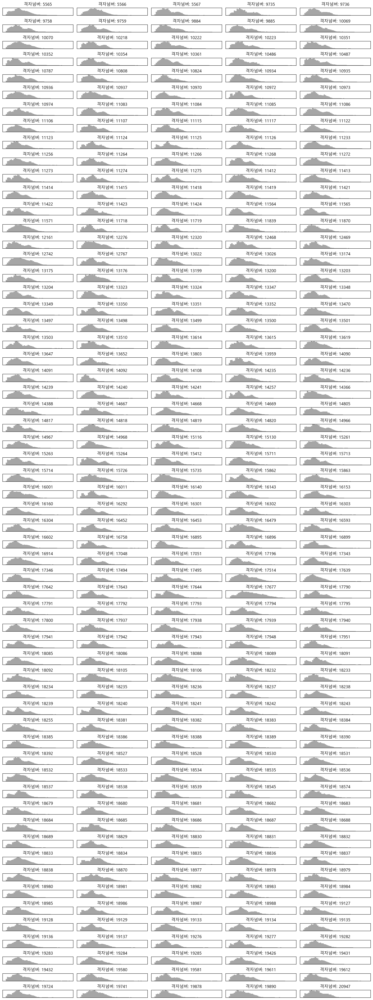

In [145]:
fig = plt.figure(figsize = (15, 40))
for num in range(len(yes_2020)):
    ax = plt.subplot(60, 5, 1+num)
    energy = df_new.loc[df_new['num'] == yes_2020[num], 'elec'].values
    mean = energy.mean().round(3)           # 평균
    std = energy.std().round(3)             # 편차
    skew = (3*(mean - np.median(energy))/energy.std()).round(3) # 왜도

    # 왜도에 따라 
    if skew >= 1.5:
        plt.hist(energy, alpha = 0.7, bins = 50, color = 'red')
    elif skew <= -1.5:
        plt.hist(energy, alpha = 0.7, bins = 50, color = 'blue')
    else:
        plt.hist(energy, alpha = 0.7, bins = 50, color = 'gray')
        
    plt.title(f'격자넘버: {yes_2020[num]}')
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('')
    plt.ylabel('')
    
plt.tight_layout()
plt.show()

### 2.2. energy usage of each building in relation to datetime

지금부터 datetime관련 변수(시간, 요일, 전체 timeline)에 따라 건물별로 전력사용량 패턴을 살펴보겠습니다.

Elec in relation to weekday and **hour**

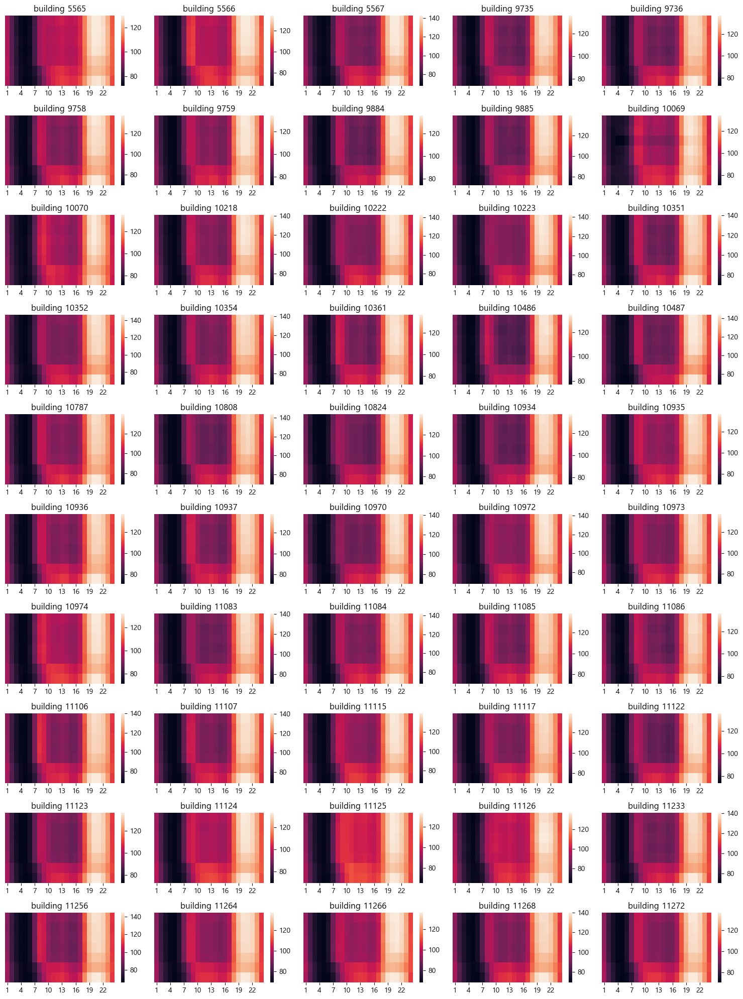

In [71]:
# energy usage of each building ~ weekday, hour
fig = plt.figure(figsize = (15, 20))
for i, num in enumerate(yes_2020[:50]):
    df = df_new[df_new['num'] == num]
    # 요일, 시간별 electric_train.elec
    df = df.groupby(['weekday', 'hh24'])['elec'].mean().reset_index().pivot(index='weekday', columns='hh24', values='elec')
    plt.subplot(10, 5, 1+i)
    sns.heatmap(df)
    plt.title(f'building {num}')
    plt.xlabel('')
    plt.ylabel('')
    plt.yticks([])

plt.tight_layout()
plt.show()

# 보통 새벽 1~7시는 자니깐 사용량이 거의 없고 15시부터 22시는 퇴근하고 집에 와서 사용량이 가장 높은거 같음 

## 각 시간과 요일에 대한 elec 중앙값 기반의 격자 클러스터링 

앞에서 건물 별 heatmap visualization을 통해, 건물마다 상이한 혹은 유사한 전력사용 패턴을 확인해 보았습니다.

분석의 용의성을 위해, 비슷한 전력사용 양상을 보이는 건물끼리 군집화 해 보겠습니다.


In [161]:
# 건물을 기준으로 하는 data frame 생성
by_weekday = df_final.groupby(['num','weekday'])['elec'].median().reset_index().pivot(index='num',columns='weekday',values='elec').reset_index()
by_hour = df_final.groupby(['num','hh24'])['elec'].median().reset_index().pivot(index='num',columns='hh24',values='elec').reset_index().drop('num', axis = 1)
df = pd.concat([by_weekday, by_hour], axis= 1)
columns = ['num'] + ['day'+str(i) for i in range(7)] + ['hh24:'+str(i) for i in range(24)]
df.columns = columns

df.head()

,num,day0,day1,day2,day3,day4,day5,day6,hh24:0,hh24:1,...,hh24:14,hh24:15,hh24:16,hh24:17,hh24:18,hh24:19,hh24:20,hh24:21,hh24:22,hh24:23
0,5565,95.505,95.275,95.65,95.275,95.355,95.735,96.44,90.305,80.225,...,92.660,93.335,97.075,107.80,117.750,120.665,119.755,117.660,111.97,102.110
1,5566,96.335,95.700,96.14,96.100,96.060,96.590,96.90,91.580,79.665,...,90.345,89.450,94.900,108.16,120.875,124.455,123.610,122.135,115.28,104.800
2,5567,92.550,91.880,92.37,92.150,92.570,96.930,98.80,91.430,79.570,...,86.340,87.080,93.930,110.25,126.350,131.220,131.210,127.730,117.71,104.950
3,9735,93.465,92.605,94.17,93.110,93.580,97.110,100.22,94.745,83.705,...,86.960,87.665,93.625,109.94,124.890,128.420,127.710,125.420,118.10,108.045
4,9736,92.995,92.110,92.89,92.595,92.785,97.760,100.40,95.315,83.605,...,87.490,87.680,93.190,108.16,123.145,127.370,126.670,125.695,119.27,108.490


In [162]:
# '전력사용량'이 아닌 '요일과 시간대에 따른 전력 사용량의 경향성'에 따라서만 군집화 할 것이므로, 특수한 scaling이 필요함
# standard scaling
for i in range(len(df)):
    # 요일 별 전력 중앙값에 대해 scaling
    df.iloc[i,1:8] = (df.iloc[i,1:8] - df.iloc[i,1:8].mean())/df.iloc[i,1:8].std()
    # 시간대별 전력 중앙값에 대해 scaling
    df.iloc[i,8:] = (df.iloc[i,8:] - df.iloc[i,8:].mean())/df.iloc[i,8:].std()

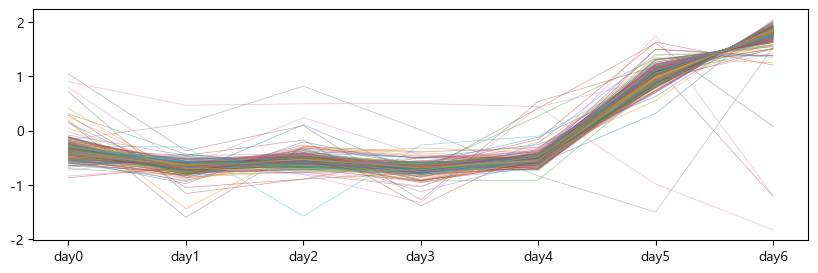

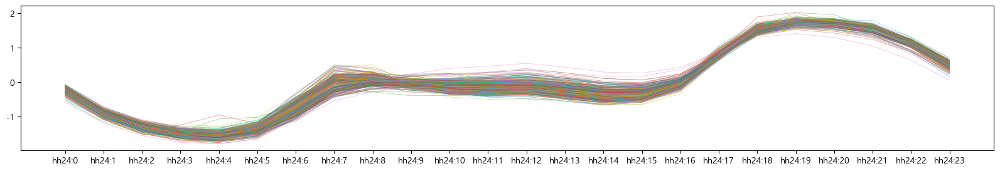

In [163]:
# visualization
fig = plt.figure(figsize = (10,3))
for i in range(len(df)):
    plt.plot(df.iloc[i, 1:8], alpha = 0.5, linewidth = 0.5)
fig = plt.figure(figsize = (20,3))
for i in range(len(df)):
    plt.plot(df.iloc[i, 8:], alpha = 0.5, linewidth = 0.5)

### kmeans clustering

k-means clustering 알고리즘으로 지역들을 군집화하자

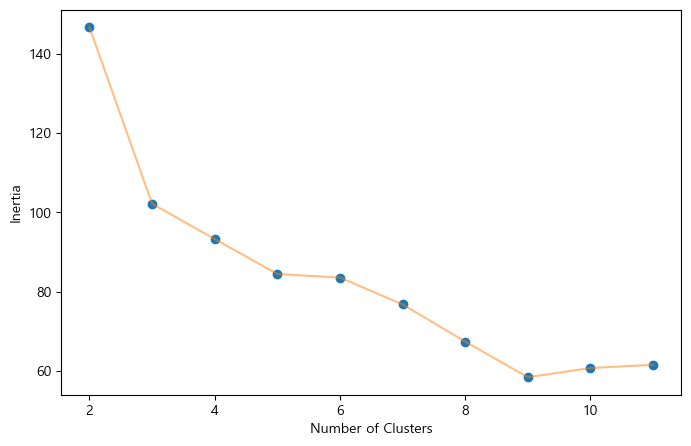

In [164]:
from sklearn.cluster import KMeans

# elbow method를 통해 군집의 개수 결정
def change_n_clusters(n_clusters, data):
    sum_of_squared_distance = []
    for n_cluster in n_clusters:
        kmeans = KMeans(n_clusters=n_cluster)
        kmeans.fit(data)
        sum_of_squared_distance.append(kmeans.inertia_)
        
    plt.figure(1 , figsize = (8, 5))
    plt.plot(n_clusters , sum_of_squared_distance , 'o')
    plt.plot(n_clusters , sum_of_squared_distance , '-' , alpha = 0.5)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')

change_n_clusters([2,3,4,5,6,7,8,9,10,11], df.iloc[:,1:])

In [165]:
k = 3                                               # 3구역으로 군집화
kmeans = KMeans(n_clusters=k, random_state = 2)         
km_cluster = kmeans.fit_predict(df.iloc[:,1:])

In [166]:
df_clust = df.copy()
df_clust['km_cluster'] = km_cluster
df_clust['km_cluster'] = df_clust['km_cluster'].map({0:0, 1:2, 2:1})
# df_clust['km_cluster'] = df_clust['km_cluster'].map({0:1, 1:3, 2:2, 3:0})

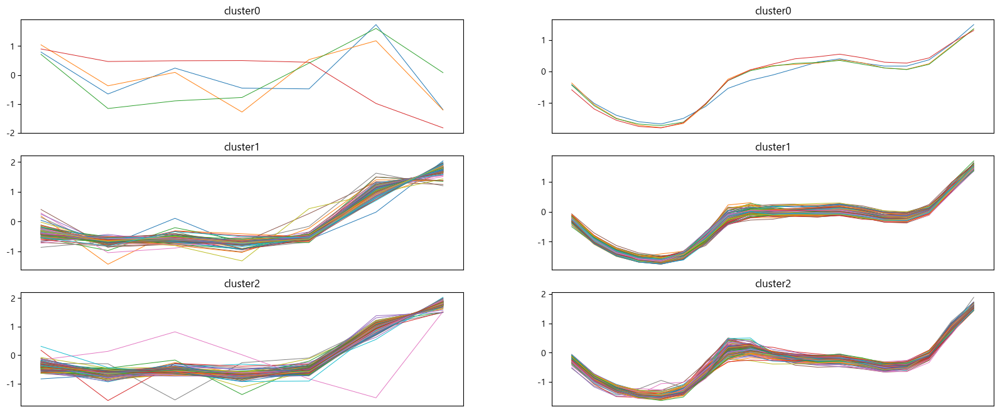

In [167]:
# visualizing result of kmeans clustering
n_c = len(np.unique(df_clust.km_cluster)) 

fig = plt.figure(figsize = (20,8))
for c in range(n_c):
    temp = df_clust[df_clust.km_cluster == c]
    plt.subplot(n_c,2,2*c+1)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,1:8], linewidth=0.7, )
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])
    plt.subplot(n_c,2,2*c+2)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,8:-6], linewidth=0.7)
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])

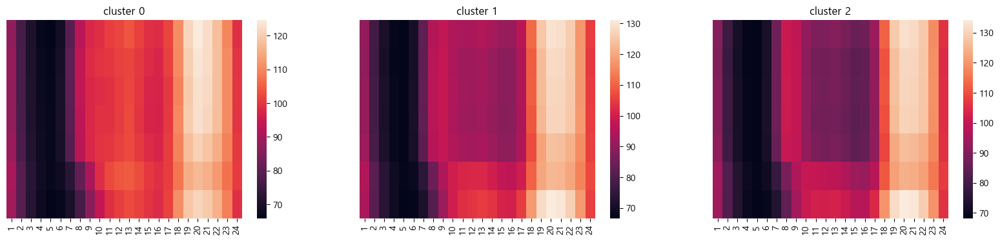

In [168]:
df_clu = df_final.merge(df_clust[['num','km_cluster']], on = 'num', how = 'left')

fig = plt.figure(figsize = (20, 4))
for c in range(k):
    temp = df_clu[df_clu.km_cluster == c]
    temp = temp.groupby(['weekday', 'hh24'])['elec'].median().reset_index().pivot(index='weekday', columns='hh24', values='elec')
    plt.subplot(1, k, c+1)
    sns.heatmap(temp)
    plt.title(f'cluster {c}')
    plt.xlabel('')
    plt.ylabel('')
    plt.yticks([])

주거지역이라 전체적으로 주말에 전력사용이 높고, 퇴근 또는 하교 후인 저녁에 가장 높음 

주말에 늦잠자서 늦은 오후까지 전력사용량이 낮음, 이후 오후에 전력량이 평일보다 높음 

In [169]:
# dictionary mapping cluster and building
match = df_clust[['num','km_cluster']]
clust_to_num = {0:[],1:[],2:[]}
for i in range(60):
    c = match.iloc[i,1]
    clust_to_num[c].append(i+1)

### Cluster analysis
군집별로 건물들을 나눈 뒤 시각화 함으로써, 각 군집 별 건물 전력소요에 대한 인사이트를 얻어 보겠습니다.

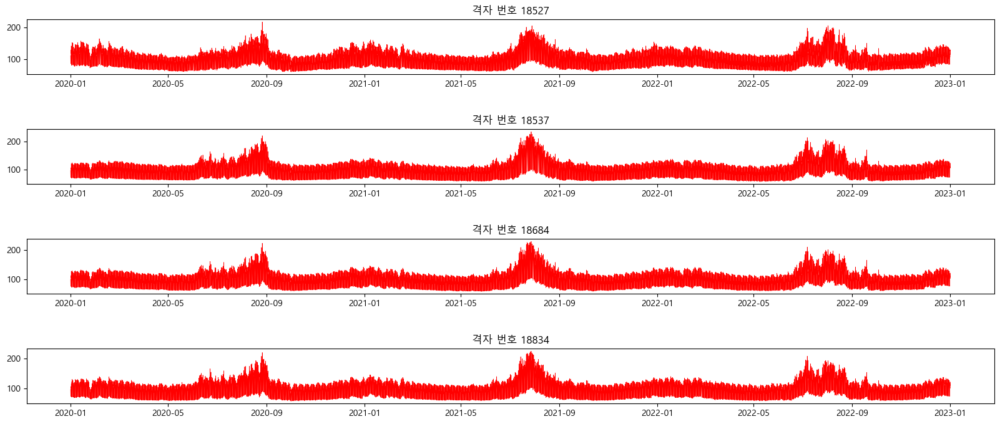

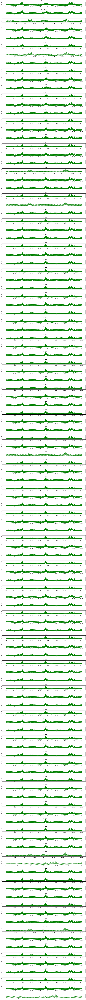

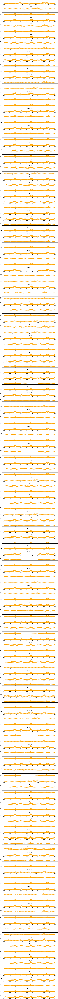

In [170]:
# linplot(energy usage of each building ~ cluster, datetime)
for c, col in enumerate(['red','green','orange']):
    temp_1 = df_clu[df_clu.km_cluster == c]
    nums = np.unique(temp_1.num)
    n_nums = len(nums)
    fig = plt.figure(figsize = (20, 2*n_nums))
    for i, num in enumerate(nums):
        temp_2 = temp_1[temp_1.num == num]
        plt.subplot(n_nums,1, i+1)
        sns.lineplot(data = temp_2, x= 'tm', y = 'elec', linewidth = 0.5, color = col)
        plt.title(f'격자 번호 {num}')
        plt.subplots_adjust(hspace = 1)
        plt.ylabel('')
        plt.xlabel('')

2020년이 빠진 격자번호를 제외하고 다시 분석할 필요가 있어 보임 -> 길이가 안맞아


마찬가지로 2023년이 빠진 데이터도 있음

다음으로 trend residence 등 시계열 정보 확인 및 추가하기 